In [1]:
import pandas as pd
import mplfinance as mpf
from gplearn.genetic import SymbolicRegressor
from sympy import *
from collections import Counter
from statsmodels.tsa.seasonal import seasonal_decompose
import matplotlib.pyplot as plt
from matplotlib import pyplot
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix, accuracy_score, recall_score, precision_score, f1_score
from sklearn.preprocessing import Normalizer
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from matplotlib import rcParams
from cycler import cycler
import category_encoders as ce
from sklearn.naive_bayes import GaussianNB
from IPython.display import Image
import pgmpy


# <font color= #6B6B6B> 1. Data Description </font>

- First we call the datasets that we aquired from data.py and exp.py which can be found on the git hub repository.
- Data ETL:
- OrderBooks, PublicTrades, OnChain (Optional)


In [2]:
# Call new datasets
ordbook = pd.read_parquet('ordbook.parquet')
pubtrade = pd.read_parquet('pubtrade.parquet')
pubtrade = pubtrade[:-1]

In [3]:
print(ordbook) 
print(pubtrade)

                     timestamp  bid_vol  bid_price  ask_price  ask_vol
0      2022-05-03 03:17:48.222  2.24880   38543.06   38543.07  3.98636
1      2022-05-03 03:17:48.222  0.00500   38542.92   38543.08  0.26144
2      2022-05-03 03:17:48.222  0.80000   38542.91   38543.20  0.80000
3      2022-05-03 03:17:48.222  0.00184   38542.59   38543.21  0.80000
4      2022-05-03 03:17:48.222  0.04930   38542.39   38543.39  0.11641
...                        ...      ...        ...        ...      ...
551795 2022-05-03 03:47:47.512  0.32990   38494.33   38537.20  0.00973
551796 2022-05-03 03:47:47.512  0.01242   38493.83   38537.22  0.00039
551797 2022-05-03 03:47:47.512  0.38956   38493.60   38537.56  0.17516
551798 2022-05-03 03:47:47.512  0.00031   38493.36   38537.69  0.02000
551799 2022-05-03 03:47:47.512  0.10000   38493.33   38537.94  0.04137

[551800 rows x 5 columns]
                    timestamp    trade_id  side     price   amount
0     2022-05-03 03:45:59.978  1156590004   buy  38510

In [4]:
print(ordbook.isna().sum())
print(pubtrade.isnull().sum())

timestamp    0
bid_vol      0
bid_price    0
ask_price    0
ask_vol      0
dtype: int64
timestamp    0
trade_id     0
side         0
price        0
amount       0
dtype: int64


# <font color= #6B6B6B> 2. Feature Engineering </font>

* Target / Feature engineering, importance, selection:
    - FE: Transformaciones lineales con OHLC
    - FI: Correlacion entre variables explicativas y variable objetivo
    - FS: Definir un criterio tipo Umbral o Threshold, Co-linealidad


Next we will create a new table with the spreads of both bid and ask prices,
- $spread = AS-BS $ 
- With this we can create a new column named mid price.
- $ MP= (Ask+Bid)/2$

In [5]:
# Spread ask price-bid price

bid_spread = ordbook.groupby(ordbook['timestamp'], group_keys=False)['bid_price'].max()
ask_spread = ordbook.groupby(ordbook['timestamp'], group_keys=False)['ask_price'].max()
levels = ordbook.groupby(ordbook['timestamp'], group_keys=False)['bid_price'].count()
spread_table = pd.merge(bid_spread, ask_spread ,on='timestamp')
spread_table['Spread'] = spread_table['ask_price'] - spread_table['bid_price']
spread_table['basis points'] = spread_table['Spread'] * 10000

# mid-price (mean between ask and bid)

spread_table['mid_price'] = (spread_table['ask_price'] + spread_table['bid_price']) * 0.5
spread_table['levels'] = levels
spread_table

,bid_price,ask_price,Spread,basis points,mid_price,levels
timestamp,,,,,,
2022-05-03 03:17:48.222,38543.06,38574.46,31.40,314000.0,38558.760,100
2022-05-03 03:17:48.571,38543.06,38575.73,32.67,326700.0,38559.395,100
2022-05-03 03:17:48.909,38543.06,38575.24,32.18,321800.0,38559.150,100
2022-05-03 03:17:49.263,38543.06,38574.69,31.63,316300.0,38558.875,100
2022-05-03 03:17:49.609,38543.06,38575.73,32.67,326700.0,38559.395,100
...,...,...,...,...,...,...
2022-05-03 03:47:46.448,38510.99,38538.00,27.01,270100.0,38524.495,100
2022-05-03 03:47:46.721,38510.99,38537.94,26.95,269500.0,38524.465,100
2022-05-03 03:47:46.985,38510.99,38537.94,26.95,269500.0,38524.465,100


In [6]:
levels = ordbook.groupby(pd.Grouper(key='timestamp', freq="1S")).count()


- Then we create another table called VWAP which is the Volume-weighted average price, which is the average price of the finantial instrument based on both volume and price.

In [7]:
vwap = ordbook.copy()

vwap['vol_ask'] = vwap['ask_price'] * vwap['ask_vol']
vwap['vol_bid'] = vwap['bid_price'] * vwap['bid_vol']
vwap['total_vol'] = vwap['ask_vol'] + vwap['bid_vol']
vwap['imb_dif'] = vwap['bid_vol'] - vwap['ask_vol']

vwap_grouped = vwap.groupby('timestamp').sum()
vwap_grouped['vwap'] = (vwap_grouped['vol_ask'] + vwap_grouped['vol_bid']) / vwap_grouped['total_vol']
vwap_grouped

,bid_vol,bid_price,ask_price,ask_vol,vol_ask,vol_bid,total_vol,imb_dif,vwap
timestamp,,,,,,,,,
2022-05-03 03:17:48.222,28.62652,3853012.98,3855846.58,38.30427,1.477010e+06,1.103043e+06,66.93079,-9.67775,38548.079019
2022-05-03 03:17:48.571,29.70723,3853055.42,3855925.78,39.10900,1.508025e+06,1.144697e+06,68.81623,-9.40177,38547.909570
2022-05-03 03:17:48.909,29.67274,3853055.42,3855903.87,40.04327,1.544035e+06,1.143368e+06,69.71601,-10.37053,38547.859282
2022-05-03 03:17:49.263,28.06614,3853018.04,3855884.70,40.65842,1.567739e+06,1.081445e+06,68.72456,-12.59228,38547.850671
2022-05-03 03:17:49.609,25.01113,3852937.27,3855911.71,40.57734,1.564614e+06,9.636995e+05,65.58847,-15.56621,38548.138685
...,...,...,...,...,...,...,...,...,...
2022-05-03 03:47:46.448,18.68495,3850156.76,3852324.07,32.30793,1.244466e+06,7.193764e+05,50.99288,-13.62298,38512.085448
2022-05-03 03:47:46.721,17.48912,3850151.93,3852314.61,34.86985,1.343173e+06,6.733357e+05,52.35897,-17.38073,38513.142734
2022-05-03 03:47:46.985,17.63624,3850156.00,3852314.61,34.86985,1.343173e+06,6.790006e+05,52.50609,-17.23361,38513.120599


In [8]:
spreadtable = spread_table.drop(['ask_price', 'bid_price'], axis=1)

In [9]:
orderb = pd.merge(vwap_grouped ,spreadtable ,on='timestamp')


In [10]:
percent_change = []
for i in range(len(orderb)):
    percent = ((orderb['mid_price'][i] - orderb['mid_price'][i-1])/orderb['mid_price'][i-1])*100
    percent_change.append(percent)
    
vol_change = []
for i in range(len(orderb)):
    volchange = ((orderb['total_vol'][i] - orderb['total_vol'][i-1])/orderb['total_vol'][i-1])
    vol_change.append(volchange)

In [11]:
orderb['Micro_return'] = percent_change
orderb['vol_change'] = vol_change
orderb

,bid_vol,bid_price,ask_price,ask_vol,vol_ask,vol_bid,total_vol,imb_dif,vwap,Spread,basis points,mid_price,levels,Micro_return,vol_change
timestamp,,,,,,,,,,,,,,,
2022-05-03 03:17:48.222,28.62652,3853012.98,3855846.58,38.30427,1.477010e+06,1.103043e+06,66.93079,-9.67775,38548.079019,31.40,314000.0,38558.760,100,0.089021,0.235951
2022-05-03 03:17:48.571,29.70723,3853055.42,3855925.78,39.10900,1.508025e+06,1.144697e+06,68.81623,-9.40177,38547.909570,32.67,326700.0,38559.395,100,0.001647,0.028170
2022-05-03 03:17:48.909,29.67274,3853055.42,3855903.87,40.04327,1.544035e+06,1.143368e+06,69.71601,-10.37053,38547.859282,32.18,321800.0,38559.150,100,-0.000635,0.013075
2022-05-03 03:17:49.263,28.06614,3853018.04,3855884.70,40.65842,1.567739e+06,1.081445e+06,68.72456,-12.59228,38547.850671,31.63,316300.0,38558.875,100,-0.000713,-0.014221
2022-05-03 03:17:49.609,25.01113,3852937.27,3855911.71,40.57734,1.564614e+06,9.636995e+05,65.58847,-15.56621,38548.138685,32.67,326700.0,38559.395,100,0.001349,-0.045633
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-05-03 03:47:46.448,18.68495,3850156.76,3852324.07,32.30793,1.244466e+06,7.193764e+05,50.99288,-13.62298,38512.085448,27.01,270100.0,38524.495,100,0.000000,0.018508
2022-05-03 03:47:46.721,17.48912,3850151.93,3852314.61,34.86985,1.343173e+06,6.733357e+05,52.35897,-17.38073,38513.142734,26.95,269500.0,38524.465,100,-0.000078,0.026790
2022-05-03 03:47:46.985,17.63624,3850156.00,3852314.61,34.86985,1.343173e+06,6.790006e+05,52.50609,-17.23361,38513.120599,26.95,269500.0,38524.465,100,0.000000,0.002810


In [12]:
# Public trade features
trades = (len(pubtrade))
total_volume = (pubtrade['amount']).sum()
print('Total Trades:',trades)
print(Counter(pubtrade['side']))

Total Trades: 11134
Counter({'buy': 6055, 'sell': 5079})


In [13]:
stats = ordbook.copy()
stats = stats.groupby('timestamp').sum()
stats

,bid_vol,bid_price,ask_price,ask_vol
timestamp,,,,
2022-05-03 03:17:48.222,28.62652,3853012.98,3855846.58,38.30427
2022-05-03 03:17:48.571,29.70723,3853055.42,3855925.78,39.10900
2022-05-03 03:17:48.909,29.67274,3853055.42,3855903.87,40.04327
2022-05-03 03:17:49.263,28.06614,3853018.04,3855884.70,40.65842
2022-05-03 03:17:49.609,25.01113,3852937.27,3855911.71,40.57734
...,...,...,...,...
2022-05-03 03:47:46.448,18.68495,3850156.76,3852324.07,32.30793
2022-05-03 03:47:46.721,17.48912,3850151.93,3852314.61,34.86985
2022-05-03 03:47:46.985,17.63624,3850156.00,3852314.61,34.86985


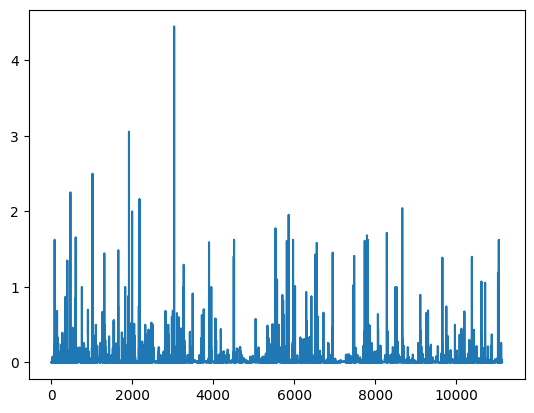

In [14]:
# 3.- Time series plot (lines)
series_pubtrade_amount = pubtrade['amount'].astype(float)
series_pubtrade_amount.plot()
pyplot.show()

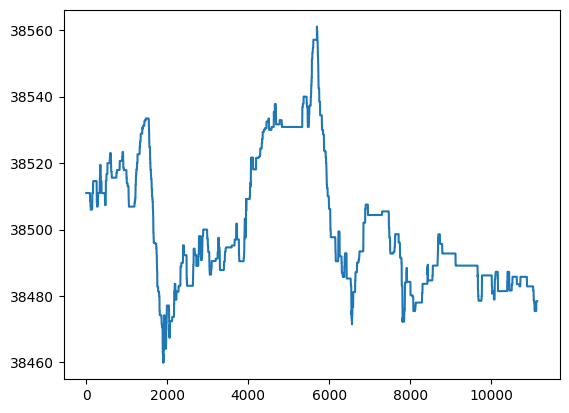

In [15]:
# Time series plot for price
series_pubtrade_price = pubtrade['price'].astype(float)
series_pubtrade_price.plot()
pyplot.show()

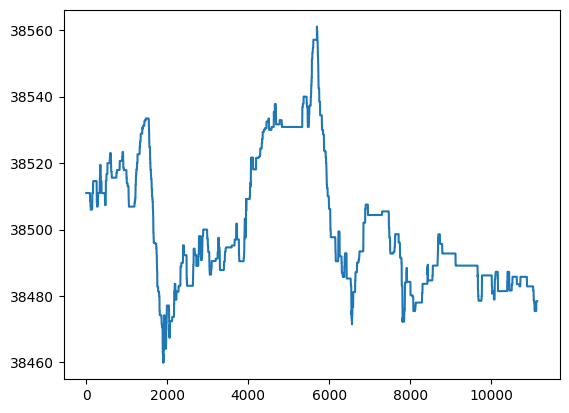

In [16]:
# Time series plot for price
series_pubtrade_price = pubtrade['price'].astype(float)
series_pubtrade_price.plot()
pyplot.show()

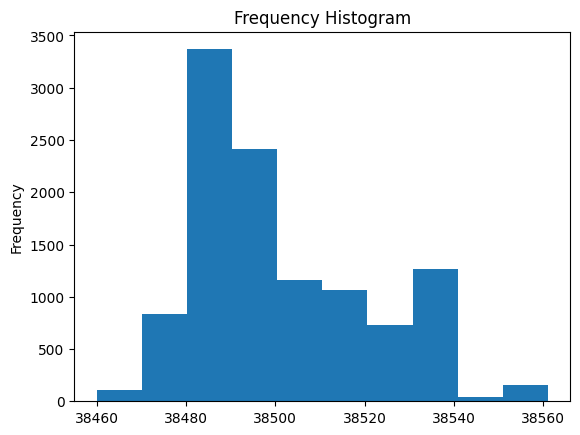

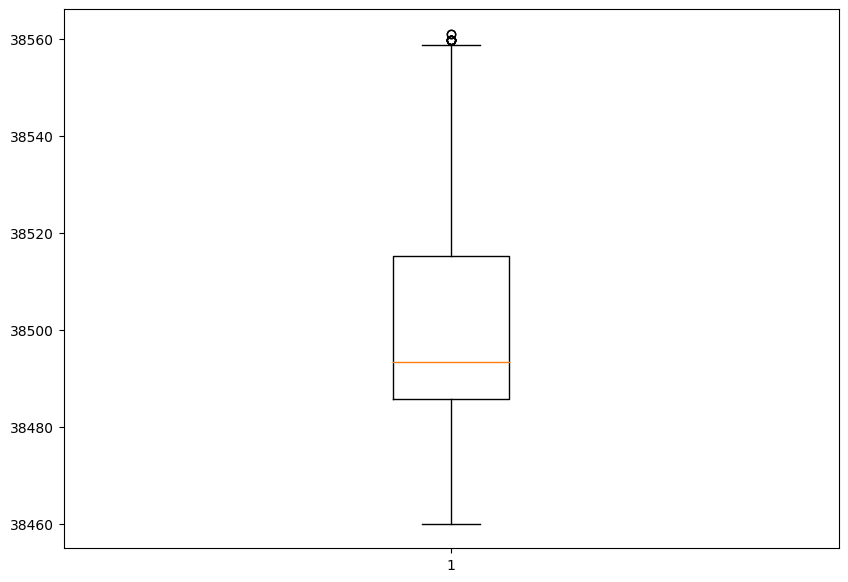

In [17]:
# Histograma Frecuencia de Variables

plt.hist(series_pubtrade_price, bins=10)
plt.gca().set(title='Frequency Histogram', ylabel='Frequency')
# 5.- Boxplot (con media y mediana)
fig = plt.figure(figsize=(10, 7))

# Creating plot
plt.boxplot(series_pubtrade_price)

# show plot
plt.show()

In [18]:
resample = orderb.resample('1S').ohlc()
resample.head()

bid_vol                                 bid_price  \
                         open      high       low     close        open   
timestamp                                                                 
2022-05-03 03:17:48  28.62652  29.70723  28.62652  29.67274  3853012.98   
2022-05-03 03:17:49  28.06614  28.06614  25.01113  26.21798  3853018.04   
2022-05-03 03:17:50  26.90360  27.54945  26.90360  27.54945  3852099.54   
2022-05-03 03:17:51  26.79916  30.79198  26.79916  30.79198  3852020.58   
2022-05-03 03:17:52  34.85293  34.85293  24.88790  26.29979  3852365.94   

                                                          ask_price  \
                           high         low       close        open   
timestamp                                                             
2022-05-03 03:17:48  3853055.42  3853012.98  3853055.42  3855846.58   
2022-05-03 03:17:49  3853018.04  3852322.38  3852322.38  3855884.70   
2022-05-03 03:17:50  3852099.54  3852068.36  3852068.36  3855472.93   
2022-05-03 03:17:51  3852318.40  3852020.58  3852318.40  3855308.64   
2022-05-03 03:17:52  3852523.50  3852365.94  3852523.50  3855580.38   

                                 ... levels        Micro_return            \
                           high  ...    low  close         open      high   
timestamp                        ...                                        
2022-05-03 03:17:48  3855925.78  ...  100.0  100.0     0.089021  0.089021   
2022-05-03 03:17:49  3855911.71  ...  100.0  100.0    -0.000713  0.001349   
2022-05-03 03:17:50  3855472.93  ...  100.0  100.0    -0.005641 -0.000882   
2022-05-03 03:17:51  3855462.26  ...  100.0  100.0    -0.001712  0.001414   
2022-05-03 03:17:52  3855716.85  ...  100.0  100.0     0.000285  0.003813   

                                        vol_change                      \
                          low     close       open      high       low   
timestamp                                                                
2022-05-03 03:17:48 -0.000635 -0.000635   0.235951  0.235951  0.013075   
2022-05-03 03:17:49 -0.003579 -0.003579  -0.014221  0.050476 -0.045633   
2022-05-03 03:17:50 -0.005641 -0.000882   0.010116  0.010116  0.002560   
2022-05-03 03:17:51 -0.001712  0.001414   0.047622  0.047622  0.033159   
2022-05-03 03:17:52  0.000000  0.000000  -0.055534  0.022606 -0.075771   

                               
                        close  
timestamp                      
2022-05-03 03:17:48  0.013075  
2022-05-03 03:17:49  0.050476  
2022-05-03 03:17:50  0.002560  
2022-05-03 03:17:51  0.033159  
2022-05-03 03:17:52  0.022606  

[5 rows x 60 columns]

### Creating the OHLCV dataset
OHLCV is an aggregated form of the market data, it stands for Open, High, Low, Close, and Volume.
* Open: The first price in the epoch.
* High: The highest price on the epoch.
* Low: The lowest point in the period.
* Close: The final price on the period.
* Volume: the total volume during the period.

The dataset is formed with the volume per period and the midprice of such period.

In [19]:
orderb.head()

,bid_vol,bid_price,ask_price,ask_vol,vol_ask,vol_bid,total_vol,imb_dif,vwap,Spread,basis points,mid_price,levels,Micro_return,vol_change
timestamp,,,,,,,,,,,,,,,
2022-05-03 03:17:48.222,28.62652,3853012.98,3855846.58,38.30427,1.477010e+06,1.103043e+06,66.93079,-9.67775,38548.079019,31.40,314000.0,38558.760,100,0.089021,0.235951
2022-05-03 03:17:48.571,29.70723,3853055.42,3855925.78,39.10900,1.508025e+06,1.144697e+06,68.81623,-9.40177,38547.909570,32.67,326700.0,38559.395,100,0.001647,0.028170
2022-05-03 03:17:48.909,29.67274,3853055.42,3855903.87,40.04327,1.544035e+06,1.143368e+06,69.71601,-10.37053,38547.859282,32.18,321800.0,38559.150,100,-0.000635,0.013075
2022-05-03 03:17:49.263,28.06614,3853018.04,3855884.70,40.65842,1.567739e+06,1.081445e+06,68.72456,-12.59228,38547.850671,31.63,316300.0,38558.875,100,-0.000713,-0.014221
2022-05-03 03:17:49.609,25.01113,3852937.27,3855911.71,40.57734,1.564614e+06,9.636995e+05,65.58847,-15.56621,38548.138685,32.67,326700.0,38559.395,100,0.001349,-0.045633


In [20]:
#OHLCV

ohlcv = orderb['mid_price'].resample('1S').ohlc()
time = ohlcv.index
ohlcv['volume'] = orderb['total_vol'].resample('1S').sum()
ohlcv['bid_vol'] = orderb['bid_vol'].resample('1S').sum()
ohlcv['ask_vol'] = orderb['ask_vol'].resample('1S').sum()
ohlcv['vol_bid'] = orderb['vol_bid'].resample('1S').sum()
ohlcv['vol_ask'] = orderb['vol_ask'].resample('1S').sum()

ohlcv['imb_dif'] = orderb['imb_dif'].resample('1S').mean()
ohlcv['vwap'] = orderb['vwap'].resample('1S').mean()
ohlcv['Spread'] = orderb['Spread'].resample('1S').mean()
ohlcv['basis points'] = orderb['basis points'].resample('1S').mean()
ohlcv['mid_price'] = orderb['mid_price'].resample('1S').mean()
ohlcv['levels'] = orderb['levels'].resample('1S').sum()
ohlcv['Micro_return'] = orderb['Micro_return'].resample('1S').mean()
ohlcv['vol_change'] = orderb['vol_change'].resample('1S').sum()

ohlcv

,open,high,low,close,volume,bid_vol,ask_vol,vol_bid,vol_ask,imb_dif,vwap,Spread,basis points,mid_price,levels,Micro_return,vol_change
timestamp,,,,,,,,,,,,,,,,,
2022-05-03 03:17:48,38558.760,38559.395,38558.760,38559.150,205.46303,88.00649,117.45654,3.391108e+06,4.529070e+06,-9.816683,38547.949290,32.083333,320833.333333,38559.101667,300,3.001094e-02,0.277196
2022-05-03 03:17:49,38558.875,38559.395,38558.015,38558.015,203.21216,79.29525,123.91691,3.055124e+06,4.778015e+06,-14.873887,38546.629337,33.256667,332566.666667,38558.761667,300,-9.811658e-04,-0.009378
2022-05-03 03:17:50,38555.840,38555.840,38555.500,38555.500,139.37039,54.45305,84.91734,2.097514e+06,3.273729e+06,-15.232145,38539.336573,32.020000,320200.000000,38555.670000,200,-3.261344e-03,0.012676
2022-05-03 03:17:51,38554.840,38555.600,38554.840,38555.600,227.60544,85.07448,142.53096,3.277121e+06,5.494428e+06,-19.152160,38538.375628,31.690000,316900.000000,38555.165000,300,8.646408e-05,0.120416
2022-05-03 03:17:52,38555.710,38557.180,38555.710,38557.180,212.77384,86.04062,126.73322,3.314859e+06,4.886144e+06,-13.564200,38543.376655,34.740000,347400.000000,38556.690000,300,1.365989e-03,-0.108698
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-05-03 03:47:43,38525.340,38525.390,38525.340,38525.340,218.76370,88.07140,130.69230,3.390857e+06,5.034578e+06,-10.655225,38513.865291,28.725000,287250.000000,38525.352500,400,4.211012e-11,-0.015403
2022-05-03 03:47:44,38525.065,38525.065,38524.530,38524.530,164.29418,56.54578,107.74840,2.176993e+06,4.150420e+06,-17.067540,38512.705368,27.436667,274366.666667,38524.708333,300,-7.008407e-04,0.013784
2022-05-03 03:47:45,38524.530,38524.660,38524.465,38524.465,161.00105,56.94028,104.06077,2.192238e+06,4.008335e+06,-15.706830,38512.611687,27.123333,271233.333333,38524.551667,300,-5.624065e-05,-0.028674


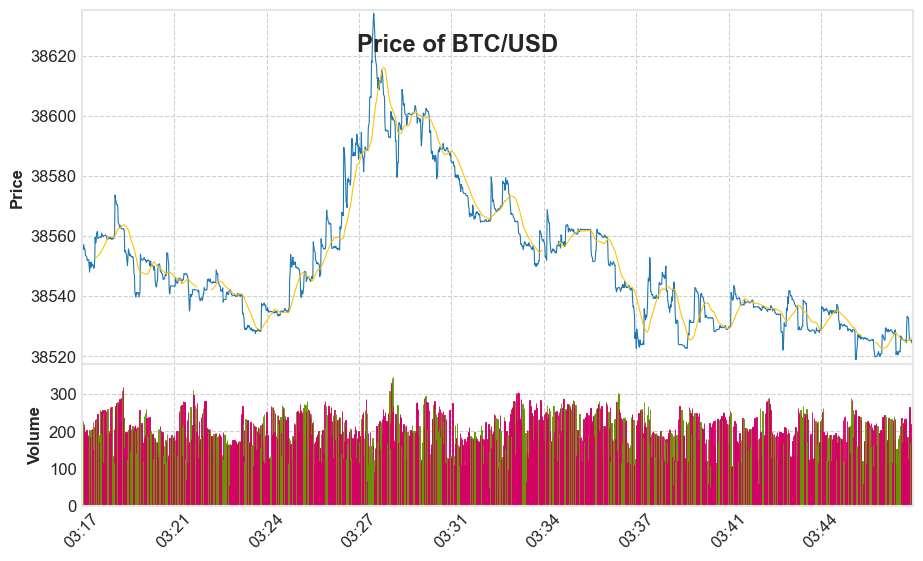

In [21]:
TICKER = 'BTC/USD'
mpf.plot(ohlcv, figratio=(10, 6), type="line",
         mav=30, volume=True,
         title=f"Price of {TICKER}",
         tight_layout=True, style="binance")

Next we will create the first features based on the OHLCV dataset.
* Volatility(HL):  $ V_t=H_t-L_t$
* High - open(HO): $ HO_t=H_t-O_t$
* Open - low(OL):  $ OL_t=O_t-L_t$
* High - Low(HL):  $ HL_t=H_t-L_t $
* Close - Open(CO): $CO_t=C_t-O_t$



In [22]:
# Volatility
volatility = []
for i in range(len(ohlcv)):
    vol = ohlcv['high'][i] - ohlcv['low'][i]
    volatility.append(vol)
ohlcv['volatility'] = volatility

# micro trends
high_open = []
for i in range(len(ohlcv)):
    ho = ohlcv['high'][i] - ohlcv['open'][i]
    high_open.append(ho)
ohlcv['high_open'] = high_open

open_low = []
for i in range(len(ohlcv)):
    ol = ohlcv['open'][i] - ohlcv['low'][i]
    open_low.append(ol)
ohlcv['open_low'] = open_low

high_low = []  # micro volatility
for i in range(len(ohlcv)):
    hl = ohlcv['high'][i] - ohlcv['low'][i]
    high_low.append(hl)
ohlcv['high_low'] = high_low

close_open = []
for i in range(len(ohlcv)):
    co = ohlcv['close'][i] - ohlcv['open'][i]
    close_open.append(co)
ohlcv['close_open'] = close_open
ohlcv

,open,high,low,close,volume,bid_vol,ask_vol,vol_bid,vol_ask,imb_dif,...,basis points,mid_price,levels,Micro_return,vol_change,volatility,high_open,open_low,high_low,close_open
timestamp,,,,,,,,,,,,,,,,,,,,,
2022-05-03 03:17:48,38558.760,38559.395,38558.760,38559.150,205.46303,88.00649,117.45654,3.391108e+06,4.529070e+06,-9.816683,...,320833.333333,38559.101667,300,3.001094e-02,0.277196,0.635,0.635,0.000,0.635,0.390
2022-05-03 03:17:49,38558.875,38559.395,38558.015,38558.015,203.21216,79.29525,123.91691,3.055124e+06,4.778015e+06,-14.873887,...,332566.666667,38558.761667,300,-9.811658e-04,-0.009378,1.380,0.520,0.860,1.380,-0.860
2022-05-03 03:17:50,38555.840,38555.840,38555.500,38555.500,139.37039,54.45305,84.91734,2.097514e+06,3.273729e+06,-15.232145,...,320200.000000,38555.670000,200,-3.261344e-03,0.012676,0.340,0.000,0.340,0.340,-0.340
2022-05-03 03:17:51,38554.840,38555.600,38554.840,38555.600,227.60544,85.07448,142.53096,3.277121e+06,5.494428e+06,-19.152160,...,316900.000000,38555.165000,300,8.646408e-05,0.120416,0.760,0.760,0.000,0.760,0.760
2022-05-03 03:17:52,38555.710,38557.180,38555.710,38557.180,212.77384,86.04062,126.73322,3.314859e+06,4.886144e+06,-13.564200,...,347400.000000,38556.690000,300,1.365989e-03,-0.108698,1.470,1.470,0.000,1.470,1.470
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-05-03 03:47:43,38525.340,38525.390,38525.340,38525.340,218.76370,88.07140,130.69230,3.390857e+06,5.034578e+06,-10.655225,...,287250.000000,38525.352500,400,4.211012e-11,-0.015403,0.050,0.050,0.000,0.050,0.000
2022-05-03 03:47:44,38525.065,38525.065,38524.530,38524.530,164.29418,56.54578,107.74840,2.176993e+06,4.150420e+06,-17.067540,...,274366.666667,38524.708333,300,-7.008407e-04,0.013784,0.535,0.000,0.535,0.535,-0.535
2022-05-03 03:47:45,38524.530,38524.660,38524.465,38524.465,161.00105,56.94028,104.06077,2.192238e+06,4.008335e+06,-15.706830,...,271233.333333,38524.551667,300,-5.624065e-05,-0.028674,0.195,0.130,0.065,0.195,-0.065


# <font color= #6B6B6B> 3. Target Engineering: Classification problem sign  </font>

Our target feature will be called sign, sign is the micro-trend $CO_t$ which will be represented in a binary way, as a 0 or 1.
* -1 = down trend.
* 0 = plateau.
* 1 = Up trend.

This will permit us to see the direction of the trend in price per epoch.

In [23]:
ohlc = pd.DataFrame(ohlcv)

sign = []

for i in range(len(ohlc)):
    sign1 = ohlc["close"][i] - ohlc["open"][i]
    sign.append(sign1)
for i in range(len(ohlc)):
    if sign[i] < -1.5:
        sign[i] = -2
    elif -1.5 <= sign[i] < 0:
        sign[i] = -1
    elif sign[i] == 0:
        sign[i]= 0
    elif 0 < sign[i] <= 1.5:
        sign[i] = 1
    else: sign[i] = 2

ohlc['sign'] = sign
sign_test = sign
ohlc.head()

,open,high,low,close,volume,bid_vol,ask_vol,vol_bid,vol_ask,imb_dif,...,mid_price,levels,Micro_return,vol_change,volatility,high_open,open_low,high_low,close_open,sign
timestamp,,,,,,,,,,,,,,,,,,,,,
2022-05-03 03:17:48,38558.760,38559.395,38558.760,38559.150,205.46303,88.00649,117.45654,3.391108e+06,4.529070e+06,-9.816683,...,38559.101667,300,0.030011,0.277196,0.635,0.635,0.00,0.635,0.39,1
2022-05-03 03:17:49,38558.875,38559.395,38558.015,38558.015,203.21216,79.29525,123.91691,3.055124e+06,4.778015e+06,-14.873887,...,38558.761667,300,-0.000981,-0.009378,1.380,0.520,0.86,1.380,-0.86,-1
2022-05-03 03:17:50,38555.840,38555.840,38555.500,38555.500,139.37039,54.45305,84.91734,2.097514e+06,3.273729e+06,-15.232145,...,38555.670000,200,-0.003261,0.012676,0.340,0.000,0.34,0.340,-0.34,-1
2022-05-03 03:17:51,38554.840,38555.600,38554.840,38555.600,227.60544,85.07448,142.53096,3.277121e+06,5.494428e+06,-19.152160,...,38555.165000,300,0.000086,0.120416,0.760,0.760,0.00,0.760,0.76,1
2022-05-03 03:17:52,38555.710,38557.180,38555.710,38557.180,212.77384,86.04062,126.73322,3.314859e+06,4.886144e+06,-13.564200,...,38556.690000,300,0.001366,-0.108698,1.470,1.470,0.00,1.470,1.47,1


In [24]:
ohlc[((ohlc["close"] - ohlc["open"]) >=0) & ((ohlc["close"] - ohlc["open"]) < 1.5)]

,open,high,low,close,volume,bid_vol,ask_vol,vol_bid,vol_ask,imb_dif,...,mid_price,levels,Micro_return,vol_change,volatility,high_open,open_low,high_low,close_open,sign
timestamp,,,,,,,,,,,,,,,,,,,,,
2022-05-03 03:17:48,38558.760,38559.395,38558.760,38559.150,205.46303,88.00649,117.45654,3.391108e+06,4.529070e+06,-9.816683,...,38559.101667,300,3.001094e-02,0.277196,0.635,0.635,0.000,0.635,0.390,1
2022-05-03 03:17:51,38554.840,38555.600,38554.840,38555.600,227.60544,85.07448,142.53096,3.277121e+06,5.494428e+06,-19.152160,...,38555.165000,300,8.646408e-05,0.120416,0.760,0.760,0.000,0.760,0.760,1
2022-05-03 03:17:52,38555.710,38557.180,38555.710,38557.180,212.77384,86.04062,126.73322,3.314859e+06,4.886144e+06,-13.564200,...,38556.690000,300,1.365989e-03,-0.108698,1.470,1.470,0.000,1.470,1.470,1
2022-05-03 03:17:55,38555.695,38555.695,38555.695,38555.695,133.68400,54.67520,79.00880,2.106291e+06,3.045979e+06,-12.166800,...,38555.695000,200,1.231987e-04,-0.006885,0.000,0.000,0.000,0.000,0.000,0
2022-05-03 03:17:57,38553.530,38554.000,38553.530,38553.530,203.43130,104.90258,98.52872,4.041444e+06,3.798864e+06,2.124620,...,38553.686667,300,-2.161000e-05,0.046952,0.470,0.470,0.000,0.470,0.000,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-05-03 03:47:38,38528.220,38528.470,38528.220,38528.470,257.19621,86.21034,170.98587,3.319213e+06,6.587298e+06,-21.193883,...,38528.345000,400,-2.793057e-03,0.010663,0.250,0.250,0.000,0.250,0.250,1
2022-05-03 03:47:41,38525.335,38525.390,38525.070,38525.390,169.73441,68.00045,101.73396,2.618079e+06,3.918993e+06,-11.244503,...,38525.265000,300,4.326348e-05,0.102877,0.320,0.055,0.265,0.320,0.055,1
2022-05-03 03:47:42,38525.070,38525.340,38525.070,38525.340,165.98745,66.82725,99.16020,2.572924e+06,3.819851e+06,-10.777650,...,38525.250000,300,-4.325957e-05,-0.050986,0.270,0.270,0.000,0.270,0.270,1


In [25]:
ohlc['sign'] = sign
ohlc['sign'] = ohlc['sign'].shift(-1)
#ohlc.dropna(inplace = True, axis=0)
ohlc

,open,high,low,close,volume,bid_vol,ask_vol,vol_bid,vol_ask,imb_dif,...,mid_price,levels,Micro_return,vol_change,volatility,high_open,open_low,high_low,close_open,sign
timestamp,,,,,,,,,,,,,,,,,,,,,
2022-05-03 03:17:48,38558.760,38559.395,38558.760,38559.150,205.46303,88.00649,117.45654,3.391108e+06,4.529070e+06,-9.816683,...,38559.101667,300,3.001094e-02,0.277196,0.635,0.635,0.000,0.635,0.390,-1.0
2022-05-03 03:17:49,38558.875,38559.395,38558.015,38558.015,203.21216,79.29525,123.91691,3.055124e+06,4.778015e+06,-14.873887,...,38558.761667,300,-9.811658e-04,-0.009378,1.380,0.520,0.860,1.380,-0.860,-1.0
2022-05-03 03:17:50,38555.840,38555.840,38555.500,38555.500,139.37039,54.45305,84.91734,2.097514e+06,3.273729e+06,-15.232145,...,38555.670000,200,-3.261344e-03,0.012676,0.340,0.000,0.340,0.340,-0.340,1.0
2022-05-03 03:17:51,38554.840,38555.600,38554.840,38555.600,227.60544,85.07448,142.53096,3.277121e+06,5.494428e+06,-19.152160,...,38555.165000,300,8.646408e-05,0.120416,0.760,0.760,0.000,0.760,0.760,1.0
2022-05-03 03:17:52,38555.710,38557.180,38555.710,38557.180,212.77384,86.04062,126.73322,3.314859e+06,4.886144e+06,-13.564200,...,38556.690000,300,1.365989e-03,-0.108698,1.470,1.470,0.000,1.470,1.470,-1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-05-03 03:47:43,38525.340,38525.390,38525.340,38525.340,218.76370,88.07140,130.69230,3.390857e+06,5.034578e+06,-10.655225,...,38525.352500,400,4.211012e-11,-0.015403,0.050,0.050,0.000,0.050,0.000,-1.0
2022-05-03 03:47:44,38525.065,38525.065,38524.530,38524.530,164.29418,56.54578,107.74840,2.176993e+06,4.150420e+06,-17.067540,...,38524.708333,300,-7.008407e-04,0.013784,0.535,0.000,0.535,0.535,-0.535,-1.0
2022-05-03 03:47:45,38524.530,38524.660,38524.465,38524.465,161.00105,56.94028,104.06077,2.192238e+06,4.008335e+06,-15.706830,...,38524.551667,300,-5.624065e-05,-0.028674,0.195,0.130,0.065,0.195,-0.065,-1.0


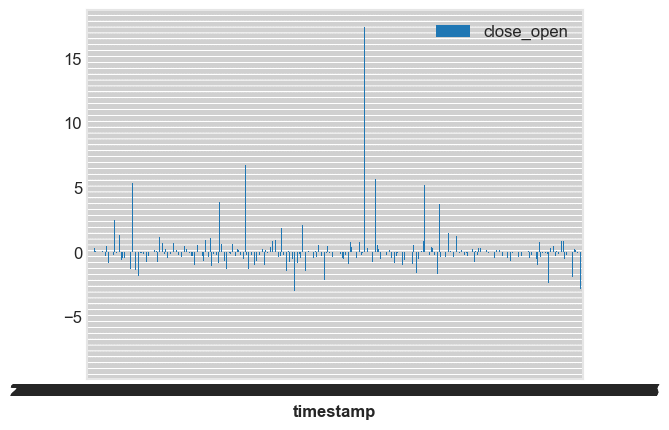

In [26]:
ax = ohlc.plot.bar(y='close_open',rot=0)

In [27]:
ohlc['sign'].value_counts()

-1.0    728
 1.0    530
 0.0    362
 2.0     91
-2.0     88
Name: sign, dtype: int64

# <font color= #6B6B6B> 4. Target Engineering: Benchmarks  </font>

First we will perform our first benchmark, the martingale, this method says that the price in $$E[X_{t}] = E[X_{t-1}]$$

In [28]:
mart = []
# cambiar treshold a variables, en vez de hardcode que defina las clases y puede ser asimetrica.
for i in range(len(ohlc)):
    sign1 = ohlc["close"][i] - ohlc["open"][i]
    mart.append(sign1)
for i in range(len(ohlc)):
    if mart[i] < -1.5:
        mart[i] = -2
    elif -1.5 <= mart[i] < 0:
        mart[i] = -1
    elif mart[i] == 0:
        mart[i]= 0
    elif 0 < sign[i] <= 1.5:
        mart[i] = 1
    else: mart[i] = 2

In [29]:
# Martingale

ohlc['martingale'] = mart
ohlc['martingale'] = ohlc['martingale'].shift(+1)
ohlc = ohlc.fillna(0)
ohlc['martingale']
ohlc2 = pd.DataFrame(ohlc)
ohlc2.to_csv('C:/Users/Emilio/Desktop/Thesis/ohlc2.csv')
ohlc2

,open,high,low,close,volume,bid_vol,ask_vol,vol_bid,vol_ask,imb_dif,...,levels,Micro_return,vol_change,volatility,high_open,open_low,high_low,close_open,sign,martingale
timestamp,,,,,,,,,,,,,,,,,,,,,
2022-05-03 03:17:48,38558.760,38559.395,38558.760,38559.150,205.46303,88.00649,117.45654,3.391108e+06,4.529070e+06,-9.816683,...,300,3.001094e-02,0.277196,0.635,0.635,0.000,0.635,0.390,-1.0,0.0
2022-05-03 03:17:49,38558.875,38559.395,38558.015,38558.015,203.21216,79.29525,123.91691,3.055124e+06,4.778015e+06,-14.873887,...,300,-9.811658e-04,-0.009378,1.380,0.520,0.860,1.380,-0.860,-1.0,1.0
2022-05-03 03:17:50,38555.840,38555.840,38555.500,38555.500,139.37039,54.45305,84.91734,2.097514e+06,3.273729e+06,-15.232145,...,200,-3.261344e-03,0.012676,0.340,0.000,0.340,0.340,-0.340,1.0,-1.0
2022-05-03 03:17:51,38554.840,38555.600,38554.840,38555.600,227.60544,85.07448,142.53096,3.277121e+06,5.494428e+06,-19.152160,...,300,8.646408e-05,0.120416,0.760,0.760,0.000,0.760,0.760,1.0,-1.0
2022-05-03 03:17:52,38555.710,38557.180,38555.710,38557.180,212.77384,86.04062,126.73322,3.314859e+06,4.886144e+06,-13.564200,...,300,1.365989e-03,-0.108698,1.470,1.470,0.000,1.470,1.470,-1.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-05-03 03:47:43,38525.340,38525.390,38525.340,38525.340,218.76370,88.07140,130.69230,3.390857e+06,5.034578e+06,-10.655225,...,400,4.211012e-11,-0.015403,0.050,0.050,0.000,0.050,0.000,-1.0,1.0
2022-05-03 03:47:44,38525.065,38525.065,38524.530,38524.530,164.29418,56.54578,107.74840,2.176993e+06,4.150420e+06,-17.067540,...,300,-7.008407e-04,0.013784,0.535,0.000,0.535,0.535,-0.535,-1.0,0.0
2022-05-03 03:47:45,38524.530,38524.660,38524.465,38524.465,161.00105,56.94028,104.06077,2.192238e+06,4.008335e+06,-15.706830,...,300,-5.624065e-05,-0.028674,0.195,0.130,0.065,0.195,-0.065,-1.0,-1.0


In [30]:
ohlc['martingale'].value_counts()

-1.0    728
 1.0    531
 0.0    362
 2.0     91
-2.0     88
Name: martingale, dtype: int64

In [31]:
accuracy_martingala = accuracy_score(sign_test, ohlc2['martingale']) * 100
print(accuracy_martingala)
confusion_mart=confusion_matrix(ohlc2['sign'], ohlc2['martingale'])
confusion_mart

28.999999999999996


array([[  8,  37,  20,  16,   7],
       [ 26, 285, 140, 231,  46],
       [  9, 149,  87, 109,   9],
       [ 39, 223, 102, 143,  23],
       [  6,  34,  13,  32,   6]], dtype=int64)

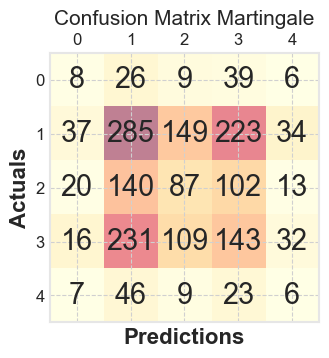

In [32]:
fig, px = plt.subplots(figsize=(3.5, 3.5))
px.matshow(confusion_mart, cmap=plt.cm.YlOrRd, alpha=0.5)
for m in range(confusion_mart.shape[0]):
    for n in range(confusion_mart.shape[1]):
        px.text(x=m,y=n,s=confusion_mart[m, n], va='center', ha='center', size='xx-large')

# Sets the labels
plt.xlabel('Predictions', fontsize=16)
plt.ylabel('Actuals', fontsize=16)
plt.title('Confusion Matrix Martingale', fontsize=15)
plt.show()

# <font color= #6B6B6B> 4.2. Naive Bayes and Logistic Regression   </font>


* Regression
* Naive Bayes\
For the next benchmark a Logistic Regresion was chosen, the reason being that the target variable is categorical in nature, being a binary variable composed of an array of 0 and 1.

The first step for this benchmark is to create a heatmap which will represent the relationship between the variables.

* Heat Map

                  open      high       low     close    volume   bid_vol  \
open          1.000000  1.000000  1.000000  1.000000  0.146732  0.117755   
high          1.000000  1.000000  1.000000  1.000000  0.146812  0.117947   
low           1.000000  1.000000  1.000000  1.000000  0.146683  0.117766   
close         1.000000  1.000000  1.000000  1.000000  0.146765  0.117958   
volume        0.146732  0.146812  0.146683  0.146765  1.000000  0.784692   
bid_vol       0.117755  0.117947  0.117766  0.117958  0.784692  1.000000   
ask_vol       0.123919  0.123880  0.123835  0.123801  0.859235  0.357112   
vol_bid       0.117741  0.117934  0.117753  0.117945  0.784543  0.999999   
vol_ask       0.123943  0.123905  0.123860  0.123826  0.859434  0.357477   
imb_dif      -0.026724 -0.026529 -0.026649 -0.026458 -0.016314  0.585539   
vwap          0.999999  0.999999  0.999999  0.999999  0.146871  0.117659   
Spread        0.308935  0.309065  0.308936  0.309064  0.169695  0.390151   
basis points

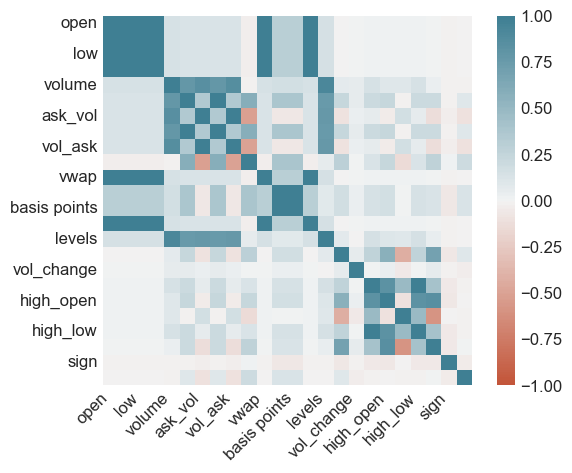

In [33]:
# Heat map
correlation = ohlc2.corr()
print(correlation)

heat = sns.heatmap(
    correlation,
    vmin=-1, vmax=1, center=0,
    cmap=sns.diverging_palette(20, 220, n=200),
    square=True
)
heat.set_xticklabels(
    heat.get_xticklabels(),
    rotation=45,
    horizontalalignment='right'
)
plt.show()

                  open      high       low     close    volume   bid_vol  \
open          1.000000  0.997766  0.998841  0.996359  0.079766  0.124760   
high          0.997766  1.000000  0.996930  0.998853  0.087422  0.138685   
low           0.998841  0.996930  1.000000  0.997734  0.075576  0.126045   
close         0.996359  0.998853  0.997734  1.000000  0.083233  0.139550   
volume        0.079766  0.087422  0.075576  0.083233  1.000000  0.777079   
bid_vol       0.124760  0.138685  0.126045  0.139550  0.777079  1.000000   
ask_vol       0.021145  0.020580  0.013782  0.013606  0.843355  0.361194   
vol_bid       0.126040  0.139960  0.127328  0.140828  0.776918  0.999997   
vol_ask       0.022693  0.022122  0.015330  0.015147  0.843517  0.361483   
imb_dif       0.074964  0.087960  0.082155  0.094466  0.000604  0.587924   
vwap          0.994300  0.993689  0.994711  0.993760  0.084550  0.117528   
Spread        0.439354  0.448672  0.441821  0.450790  0.114036  0.377967   
basis points

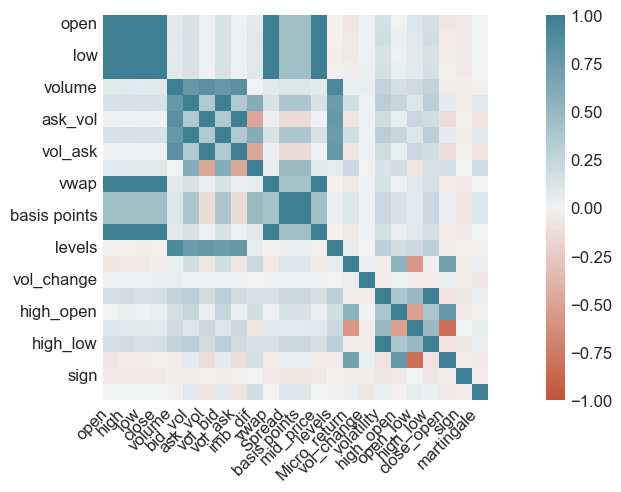

In [176]:
# Heat map spearman
correlation = ohlc2.corr(method= 'spearman')
print(correlation)

heat = sns.heatmap(
    correlation,
    vmin=-1, vmax=1, center=0,
    cmap=sns.diverging_palette(20, 220, n=200),
    square=True
)
heat.set_xticklabels(
    heat.get_xticklabels(),
    rotation=45,
    horizontalalignment='right'
)
plt.show()

                  open      high       low     close    volume   bid_vol  \
open          1.000000  0.980734  0.983562  0.966264  0.055624  0.083716   
high          0.980734  1.000000  0.970872  0.983466  0.060645  0.093269   
low           0.983562  0.970872  1.000000  0.980786  0.052965  0.084443   
close         0.966264  0.983466  0.980786  1.000000  0.057888  0.093632   
volume        0.055624  0.060645  0.052965  0.057888  1.000000  0.581958   
bid_vol       0.083716  0.093269  0.084443  0.093632  0.581958  1.000000   
ask_vol       0.015417  0.014939  0.010527  0.010256  0.654278  0.236236   
vol_bid       0.084603  0.094156  0.085330  0.094519  0.581822  0.999108   
vol_ask       0.016473  0.015989  0.011583  0.011306  0.654483  0.236444   
imb_dif       0.050308  0.058952  0.055238  0.063484 -0.000251  0.415923   
vwap          0.935431  0.933208  0.938022  0.934014  0.058943  0.077893   
Spread        0.293079  0.300877  0.295884  0.302309  0.077030  0.255550   
basis points

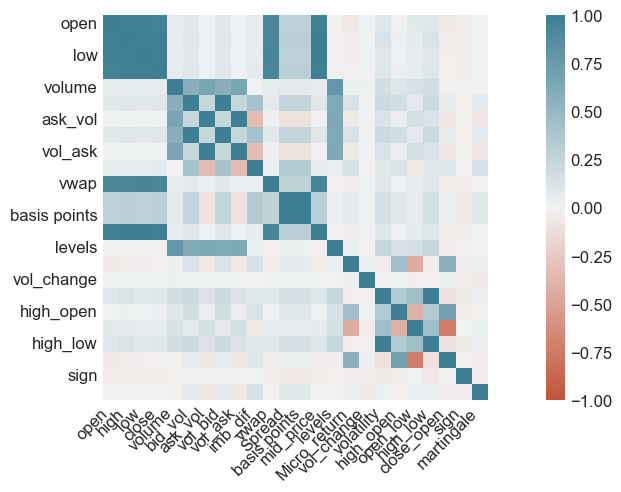

In [177]:
# Heat map kendall
correlation = ohlc2.corr(method = 'kendall')
print(correlation)

heat = sns.heatmap(
    correlation,
    vmin=-1, vmax=1, center=0,
    cmap=sns.diverging_palette(20, 220, n=200),
    square=True
)
heat.set_xticklabels(
    heat.get_xticklabels(),
    rotation=45,
    horizontalalignment='right'
)
plt.show()

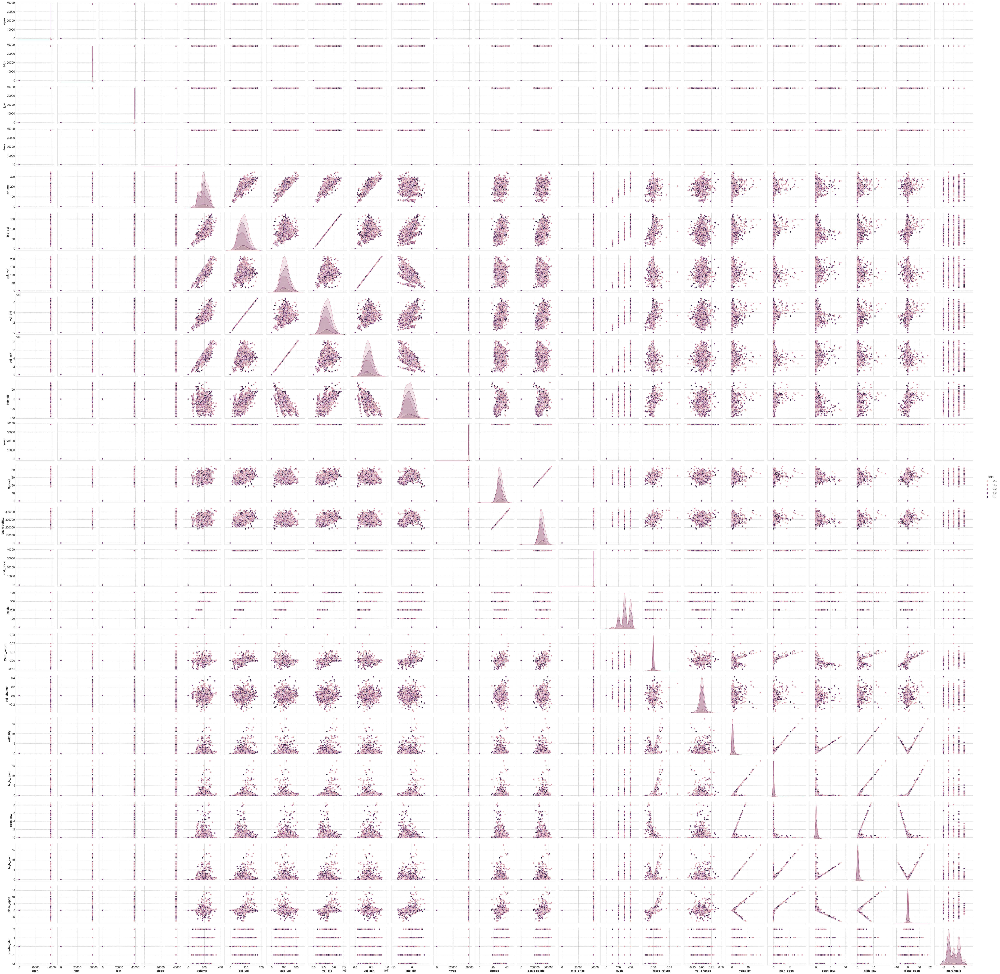

In [174]:
sns.pairplot(ohlc2, hue='sign', height=2.5)

In [35]:
ma = ohlc2.rolling(5).mean()
std = ohlc2.std()
ma,std

(                          open       high        low      close      volume  \
 timestamp                                                                     
 2022-05-03 03:17:48        NaN        NaN        NaN        NaN         NaN   
 2022-05-03 03:17:49        NaN        NaN        NaN        NaN         NaN   
 2022-05-03 03:17:50        NaN        NaN        NaN        NaN         NaN   
 2022-05-03 03:17:51        NaN        NaN        NaN        NaN         NaN   
 2022-05-03 03:17:52  38556.805  38557.482  38556.565  38557.089  197.684972   
 ...                        ...        ...        ...        ...         ...   
 2022-05-03 03:47:43  38525.933  38526.008  38525.243  38525.361  207.460744   
 2022-05-03 03:47:44  38525.302  38525.377  38525.070  38525.188  187.532026   
 2022-05-03 03:47:45  38525.068  38525.169  38524.895  38525.013  175.956158   
 2022-05-03 03:47:46  38524.900  38524.990  38524.774  38524.828  183.194112   
 2022-05-03 03:47:47  38524.779  38524.8

In [36]:
# Preprocessing Log, Scale, Standardize (mean, median), Normalize
X = ohlc2.iloc[:, 4:-2]
X

,volume,bid_vol,ask_vol,vol_bid,vol_ask,imb_dif,vwap,Spread,basis points,mid_price,levels,Micro_return,vol_change,volatility,high_open,open_low,high_low,close_open
timestamp,,,,,,,,,,,,,,,,,,
2022-05-03 03:17:48,205.46303,88.00649,117.45654,3.391108e+06,4.529070e+06,-9.816683,38547.949290,32.083333,320833.333333,38559.101667,300,3.001094e-02,0.277196,0.635,0.635,0.000,0.635,0.390
2022-05-03 03:17:49,203.21216,79.29525,123.91691,3.055124e+06,4.778015e+06,-14.873887,38546.629337,33.256667,332566.666667,38558.761667,300,-9.811658e-04,-0.009378,1.380,0.520,0.860,1.380,-0.860
2022-05-03 03:17:50,139.37039,54.45305,84.91734,2.097514e+06,3.273729e+06,-15.232145,38539.336573,32.020000,320200.000000,38555.670000,200,-3.261344e-03,0.012676,0.340,0.000,0.340,0.340,-0.340
2022-05-03 03:17:51,227.60544,85.07448,142.53096,3.277121e+06,5.494428e+06,-19.152160,38538.375628,31.690000,316900.000000,38555.165000,300,8.646408e-05,0.120416,0.760,0.760,0.000,0.760,0.760
2022-05-03 03:17:52,212.77384,86.04062,126.73322,3.314859e+06,4.886144e+06,-13.564200,38543.376655,34.740000,347400.000000,38556.690000,300,1.365989e-03,-0.108698,1.470,1.470,0.000,1.470,1.470
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-05-03 03:47:43,218.76370,88.07140,130.69230,3.390857e+06,5.034578e+06,-10.655225,38513.865291,28.725000,287250.000000,38525.352500,400,4.211012e-11,-0.015403,0.050,0.050,0.000,0.050,0.000
2022-05-03 03:47:44,164.29418,56.54578,107.74840,2.176993e+06,4.150420e+06,-17.067540,38512.705368,27.436667,274366.666667,38524.708333,300,-7.008407e-04,0.013784,0.535,0.000,0.535,0.535,-0.535
2022-05-03 03:47:45,161.00105,56.94028,104.06077,2.192238e+06,4.008335e+06,-15.706830,38512.611687,27.123333,271233.333333,38524.551667,300,-5.624065e-05,-0.028674,0.195,0.130,0.065,0.195,-0.065


In [37]:
y = ohlc2['sign']
y_true = y
X

,volume,bid_vol,ask_vol,vol_bid,vol_ask,imb_dif,vwap,Spread,basis points,mid_price,levels,Micro_return,vol_change,volatility,high_open,open_low,high_low,close_open
timestamp,,,,,,,,,,,,,,,,,,
2022-05-03 03:17:48,205.46303,88.00649,117.45654,3.391108e+06,4.529070e+06,-9.816683,38547.949290,32.083333,320833.333333,38559.101667,300,3.001094e-02,0.277196,0.635,0.635,0.000,0.635,0.390
2022-05-03 03:17:49,203.21216,79.29525,123.91691,3.055124e+06,4.778015e+06,-14.873887,38546.629337,33.256667,332566.666667,38558.761667,300,-9.811658e-04,-0.009378,1.380,0.520,0.860,1.380,-0.860
2022-05-03 03:17:50,139.37039,54.45305,84.91734,2.097514e+06,3.273729e+06,-15.232145,38539.336573,32.020000,320200.000000,38555.670000,200,-3.261344e-03,0.012676,0.340,0.000,0.340,0.340,-0.340
2022-05-03 03:17:51,227.60544,85.07448,142.53096,3.277121e+06,5.494428e+06,-19.152160,38538.375628,31.690000,316900.000000,38555.165000,300,8.646408e-05,0.120416,0.760,0.760,0.000,0.760,0.760
2022-05-03 03:17:52,212.77384,86.04062,126.73322,3.314859e+06,4.886144e+06,-13.564200,38543.376655,34.740000,347400.000000,38556.690000,300,1.365989e-03,-0.108698,1.470,1.470,0.000,1.470,1.470
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-05-03 03:47:43,218.76370,88.07140,130.69230,3.390857e+06,5.034578e+06,-10.655225,38513.865291,28.725000,287250.000000,38525.352500,400,4.211012e-11,-0.015403,0.050,0.050,0.000,0.050,0.000
2022-05-03 03:47:44,164.29418,56.54578,107.74840,2.176993e+06,4.150420e+06,-17.067540,38512.705368,27.436667,274366.666667,38524.708333,300,-7.008407e-04,0.013784,0.535,0.000,0.535,0.535,-0.535
2022-05-03 03:47:45,161.00105,56.94028,104.06077,2.192238e+06,4.008335e+06,-15.706830,38512.611687,27.123333,271233.333333,38524.551667,300,-5.624065e-05,-0.028674,0.195,0.130,0.065,0.195,-0.065


To use the data in the log regression we require to fit the data trought transformations as the data has different scales which would give us a bad forecast.

* The first one is the Normalizer which transforms numeric columns to a standard scale. in this instance it is done by the maximum absolute scaling method which has the following formula:
$$ x_{scaled} =\frac{ x}{max(|x|)} $$

In [38]:
# Normalizer
transformer = Normalizer(norm= 'max').fit(X) 
transformed = transformer.transform(X)
X_normalized = pd.DataFrame(transformed,index = X.index, columns= X.columns)
X_normalized 

,volume,bid_vol,ask_vol,vol_bid,vol_ask,imb_dif,vwap,Spread,basis points,mid_price,levels,Micro_return,vol_change,volatility,high_open,open_low,high_low,close_open
timestamp,,,,,,,,,,,,,,,,,,
2022-05-03 03:17:48,0.000045,0.000019,0.000026,0.748743,1.0,-0.000002,0.008511,0.000007,0.070839,0.008514,0.000066,6.626291e-09,6.120372e-08,1.402054e-07,1.402054e-07,0.000000e+00,1.402054e-07,8.611040e-08
2022-05-03 03:17:49,0.000043,0.000017,0.000026,0.639413,1.0,-0.000003,0.008067,0.000007,0.069604,0.008070,0.000063,-2.053501e-10,-1.962689e-09,2.888229e-07,1.088318e-07,1.799911e-07,2.888229e-07,-1.799911e-07
2022-05-03 03:17:50,0.000043,0.000017,0.000026,0.640711,1.0,-0.000005,0.011772,0.000010,0.097809,0.011777,0.000061,-9.962170e-10,3.871995e-09,1.038571e-07,0.000000e+00,1.038571e-07,1.038571e-07,-1.038571e-07
2022-05-03 03:17:51,0.000041,0.000015,0.000026,0.596444,1.0,-0.000003,0.007014,0.000006,0.057677,0.007017,0.000055,1.573668e-11,2.191603e-08,1.383219e-07,1.383219e-07,0.000000e+00,1.383219e-07,1.383219e-07
2022-05-03 03:17:52,0.000044,0.000018,0.000026,0.678420,1.0,-0.000003,0.007888,0.000007,0.071099,0.007891,0.000061,2.795638e-10,-2.224621e-08,3.008507e-07,3.008507e-07,0.000000e+00,3.008507e-07,3.008507e-07
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-05-03 03:47:43,0.000043,0.000017,0.000026,0.673514,1.0,-0.000002,0.007650,0.000006,0.057055,0.007652,0.000079,8.364180e-18,-3.059520e-09,9.931318e-09,9.931318e-09,0.000000e+00,9.931318e-09,0.000000e+00
2022-05-03 03:47:44,0.000040,0.000014,0.000026,0.524523,1.0,-0.000004,0.009279,0.000007,0.066106,0.009282,0.000072,-1.688602e-10,3.321060e-09,1.289026e-07,0.000000e+00,1.289026e-07,1.289026e-07,-1.289026e-07
2022-05-03 03:47:45,0.000040,0.000014,0.000026,0.546920,1.0,-0.000004,0.009608,0.000007,0.067667,0.009611,0.000075,-1.403093e-11,-7.153505e-09,4.864863e-08,3.243242e-08,1.621621e-08,4.864863e-08,-1.621621e-08


The second method chosen was Min Max Scaler, which transforms the features by scaling them to a given range in this case 0 to 1.

$$ X_{norm}= \frac{X-X_{min}} {X_{max}-X_{min}} $$

In [39]:
#  Min Max Scaler
scale = MinMaxScaler()
X_scale = scale.fit(X)
X_scale = scale.transform(X)
X_scale = pd.DataFrame(X_scale,index = X.index, columns= X.columns)
X_scale

,volume,bid_vol,ask_vol,vol_bid,vol_ask,imb_dif,vwap,Spread,basis points,mid_price,levels,Micro_return,vol_change,volatility,high_open,open_low,high_low,close_open
timestamp,,,,,,,,,,,,,,,,,,
2022-05-03 03:17:48,0.595999,0.501538,0.539847,0.501095,0.539368,0.379435,0.998375,0.728877,0.728877,0.998055,0.75,1.000000,0.808432,0.036358,0.036358,0.000000,0.036358,0.343269
2022-05-03 03:17:49,0.589470,0.451894,0.569539,0.451447,0.569015,0.308824,0.998341,0.755533,0.755533,0.998046,0.75,0.225882,0.440894,0.079015,0.029774,0.100762,0.079015,0.295192
2022-05-03 03:17:50,0.404280,0.310321,0.390292,0.309944,0.389869,0.303822,0.998152,0.727438,0.727438,0.997966,0.50,0.168927,0.469178,0.019468,0.000000,0.039836,0.019468,0.315192
2022-05-03 03:17:51,0.660229,0.484829,0.655092,0.484251,0.654333,0.249088,0.998127,0.719941,0.719941,0.997953,0.75,0.252549,0.607358,0.043516,0.043516,0.000000,0.043516,0.357500
2022-05-03 03:17:52,0.617206,0.490335,0.582483,0.489828,0.581892,0.327110,0.998257,0.789232,0.789232,0.997992,0.75,0.284509,0.313513,0.084168,0.084168,0.000000,0.084168,0.384808
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-05-03 03:47:43,0.634582,0.501908,0.600680,0.501058,0.599569,0.367727,0.997492,0.652581,0.652581,0.997181,1.00,0.250389,0.433166,0.002863,0.002863,0.000000,0.002863,0.328269
2022-05-03 03:47:44,0.476578,0.322247,0.495227,0.321688,0.494275,0.278195,0.997462,0.623313,0.623313,0.997164,0.75,0.232884,0.470599,0.030633,0.000000,0.062683,0.030633,0.307692
2022-05-03 03:47:45,0.467026,0.324495,0.478278,0.323941,0.477354,0.297194,0.997460,0.616194,0.616194,0.997160,0.75,0.248984,0.416146,0.011165,0.007443,0.007616,0.011165,0.325769


The last one is the standardization method, which removes the mean and sacales to unit variance.

$$ Z=\frac{(X-u)}{S} $$
where:
* U = mean of the training samples 
* S= Standard deviation

In [40]:
# Standardize
scaler = StandardScaler()
scaled = scaler.fit_transform(X)
X_standard = pd.DataFrame(scaled,index = X.index, columns= X.columns)
X_standard

,volume,bid_vol,ask_vol,vol_bid,vol_ask,imb_dif,vwap,Spread,basis points,mid_price,levels,Micro_return,vol_change,volatility,high_open,open_low,high_low,close_open
timestamp,,,,,,,,,,,,,,,,,,
2022-05-03 03:17:48,0.314831,0.204910,0.305287,0.205303,0.306114,-0.138050,0.046199,0.599516,0.599516,0.045711,-0.080414,15.145799,3.711889,-0.055111,0.207878,-0.419843,-0.055111,0.234009
2022-05-03 03:17:49,0.272229,-0.096128,0.489534,-0.095977,0.490288,-0.573921,0.045359,0.893099,0.893099,0.045495,-0.080414,-0.475248,-0.187044,0.460020,0.117846,0.626024,0.460020,-0.562283
2022-05-03 03:17:50,-0.936102,-0.954610,-0.622720,-0.954671,-0.622611,-0.604799,0.040721,0.583670,0.583670,0.043529,-1.307070,-1.624533,0.113003,-0.259089,-0.289255,-0.006361,-0.259089,-0.231026
2022-05-03 03:17:51,0.733919,0.103588,1.020401,0.103090,1.020303,-0.942658,0.040110,0.501099,0.501099,0.043208,-0.080414,0.062873,1.578845,0.031321,0.305739,-0.419843,0.031321,0.469712
2022-05-03 03:17:52,0.453202,0.136975,0.569855,0.136930,0.570284,-0.461042,0.043291,1.264247,1.264247,0.044178,-0.080414,0.707796,-1.538333,0.522251,0.861587,-0.419843,0.522251,0.922006
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-05-03 03:47:43,0.566572,0.207153,0.682766,0.205078,0.680098,-0.210322,0.024520,-0.240780,-0.240780,0.024252,1.146242,0.019293,-0.269025,-0.459609,-0.250110,-0.419843,-0.459609,-0.014434
2022-05-03 03:47:44,-0.464370,-0.882291,0.028414,-0.883402,0.025982,-0.762989,0.023782,-0.563137,-0.563137,0.023842,-0.080414,-0.333954,0.128077,-0.124256,-0.289255,0.230783,-0.124256,-0.355247
2022-05-03 03:47:45,-0.526699,-0.868658,-0.076756,-0.869732,-0.079136,-0.645711,0.023722,-0.641536,-0.641536,0.023743,-0.080414,-0.009055,-0.449571,-0.359349,-0.187479,-0.340795,-0.359349,-0.055841


                volume   bid_vol   ask_vol   vol_bid   vol_ask   imb_dif  \
volume        1.000000  0.777079  0.843355  0.776918  0.843517  0.000604   
bid_vol       0.777079  1.000000  0.361194  0.999997  0.361483  0.587924   
ask_vol       0.843355  0.361194  1.000000  0.360984  0.999996 -0.482135   
vol_bid       0.776918  0.999997  0.360984  1.000000  0.361275  0.588065   
vol_ask       0.843517  0.361483  0.999996  0.361275  1.000000 -0.481897   
imb_dif       0.000604  0.587924 -0.482135  0.588065 -0.481897  1.000000   
vwap          0.084550  0.117528  0.034463  0.118811  0.036009  0.056831   
Spread        0.114036  0.377967 -0.136600  0.378480 -0.135742  0.477096   
basis points  0.114037  0.377968 -0.136600  0.378481 -0.135742  0.477097   
mid_price     0.081349  0.132084  0.016918  0.133363  0.018464  0.084973   
levels        0.909327  0.748852  0.770415  0.748590  0.770367  0.061452   
Micro_return  0.043129  0.177853 -0.076631  0.177738 -0.076752  0.216885   
vol_change  

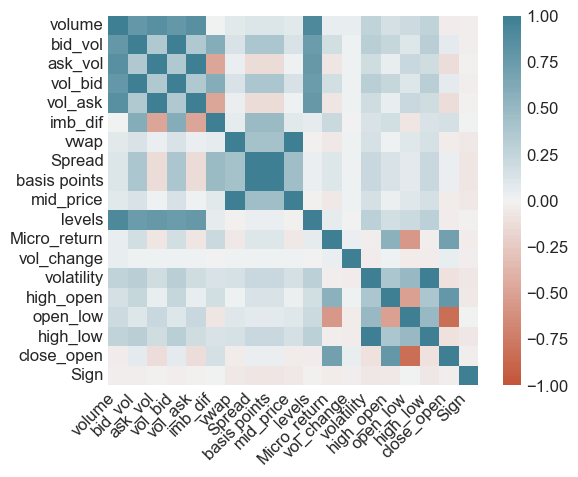

In [41]:
correla = pd.DataFrame(X_scale, index=ohlc2.index).copy()
correla['Sign'] = ohlc2['sign']
correlation_transformed = correla.corr(method='spearman')
print(correlation_transformed)

heat2 = sns.heatmap(
    correlation_transformed,
    vmin=-1, vmax=1, center=0,
    cmap=sns.diverging_palette(20, 220, n=200),
    square=True
)
heat2.set_xticklabels(
    heat2.get_xticklabels(),
    rotation=45,
    horizontalalignment='right'
)
plt.show()

In [42]:
X_scale

,volume,bid_vol,ask_vol,vol_bid,vol_ask,imb_dif,vwap,Spread,basis points,mid_price,levels,Micro_return,vol_change,volatility,high_open,open_low,high_low,close_open
timestamp,,,,,,,,,,,,,,,,,,
2022-05-03 03:17:48,0.595999,0.501538,0.539847,0.501095,0.539368,0.379435,0.998375,0.728877,0.728877,0.998055,0.75,1.000000,0.808432,0.036358,0.036358,0.000000,0.036358,0.343269
2022-05-03 03:17:49,0.589470,0.451894,0.569539,0.451447,0.569015,0.308824,0.998341,0.755533,0.755533,0.998046,0.75,0.225882,0.440894,0.079015,0.029774,0.100762,0.079015,0.295192
2022-05-03 03:17:50,0.404280,0.310321,0.390292,0.309944,0.389869,0.303822,0.998152,0.727438,0.727438,0.997966,0.50,0.168927,0.469178,0.019468,0.000000,0.039836,0.019468,0.315192
2022-05-03 03:17:51,0.660229,0.484829,0.655092,0.484251,0.654333,0.249088,0.998127,0.719941,0.719941,0.997953,0.75,0.252549,0.607358,0.043516,0.043516,0.000000,0.043516,0.357500
2022-05-03 03:17:52,0.617206,0.490335,0.582483,0.489828,0.581892,0.327110,0.998257,0.789232,0.789232,0.997992,0.75,0.284509,0.313513,0.084168,0.084168,0.000000,0.084168,0.384808
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-05-03 03:47:43,0.634582,0.501908,0.600680,0.501058,0.599569,0.367727,0.997492,0.652581,0.652581,0.997181,1.00,0.250389,0.433166,0.002863,0.002863,0.000000,0.002863,0.328269
2022-05-03 03:47:44,0.476578,0.322247,0.495227,0.321688,0.494275,0.278195,0.997462,0.623313,0.623313,0.997164,0.75,0.232884,0.470599,0.030633,0.000000,0.062683,0.030633,0.307692
2022-05-03 03:47:45,0.467026,0.324495,0.478278,0.323941,0.477354,0.297194,0.997460,0.616194,0.616194,0.997160,0.75,0.248984,0.416146,0.011165,0.007443,0.007616,0.011165,0.325769


The logistic Regression was chosen because of the type of target variable which is a binary categorical kind of feature. 
* The cost function in this case is the following one:
$$ \underset{w,c}{min}\frac{1-p}{2}{w}^{T}w+\rho||w||_1+C\sum_{i=1}^{n}log(exp(-y_i(\mathrm{X}_{i}^{T}w+c))+1) $$

This cost function is the one used for Elastic Net regularization, which is a combination of the L1 and L2 penalizations.

Next we split the dataset, as this is a timeseries we require to split it without changing the timeline or it would influence the forecasting.

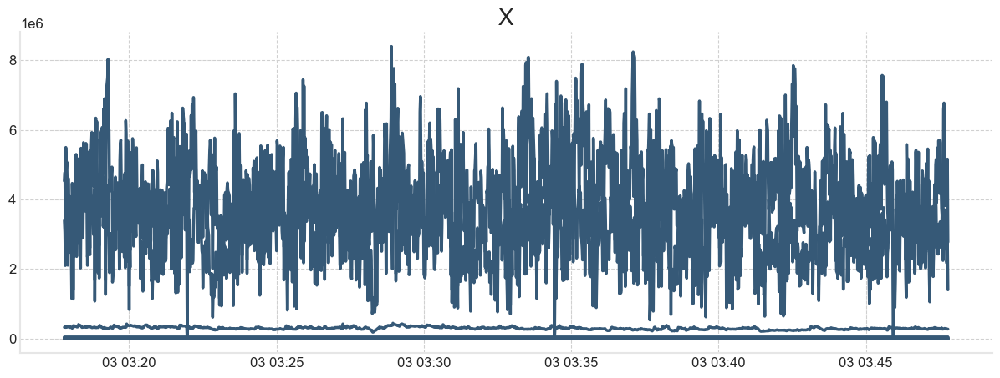

In [43]:
rcParams['figure.figsize'] = 15, 5
rcParams['axes.spines.top'] = False
rcParams['axes.spines.right'] = False
rcParams['axes.prop_cycle'] = cycler(color=['#365977'])
rcParams['lines.linewidth'] = 2.5
plt.title('X',size=20)
plt.plot(X)

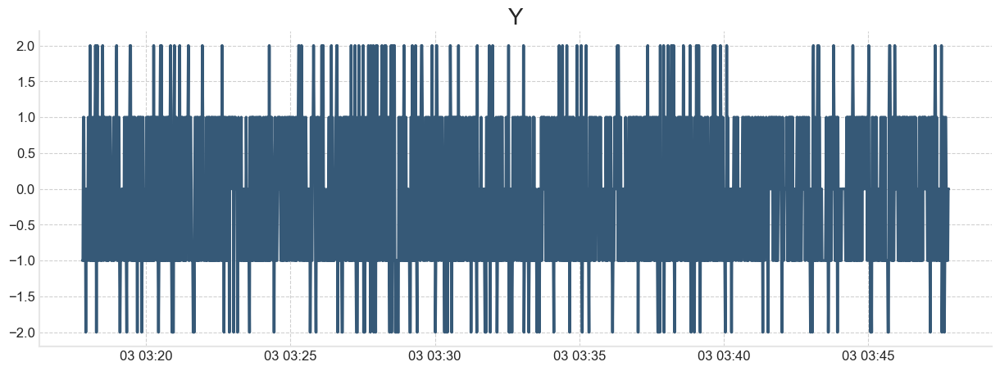

In [44]:
rcParams['figure.figsize'] = 15, 5
rcParams['axes.spines.top'] = False
rcParams['axes.spines.right'] = False
rcParams['axes.prop_cycle'] = cycler(color=['#365977'])
rcParams['lines.linewidth'] = 2.5
plt.title('Y',size=20)
plt.plot(y)

In [45]:
test_size = int(len(X)*.20)

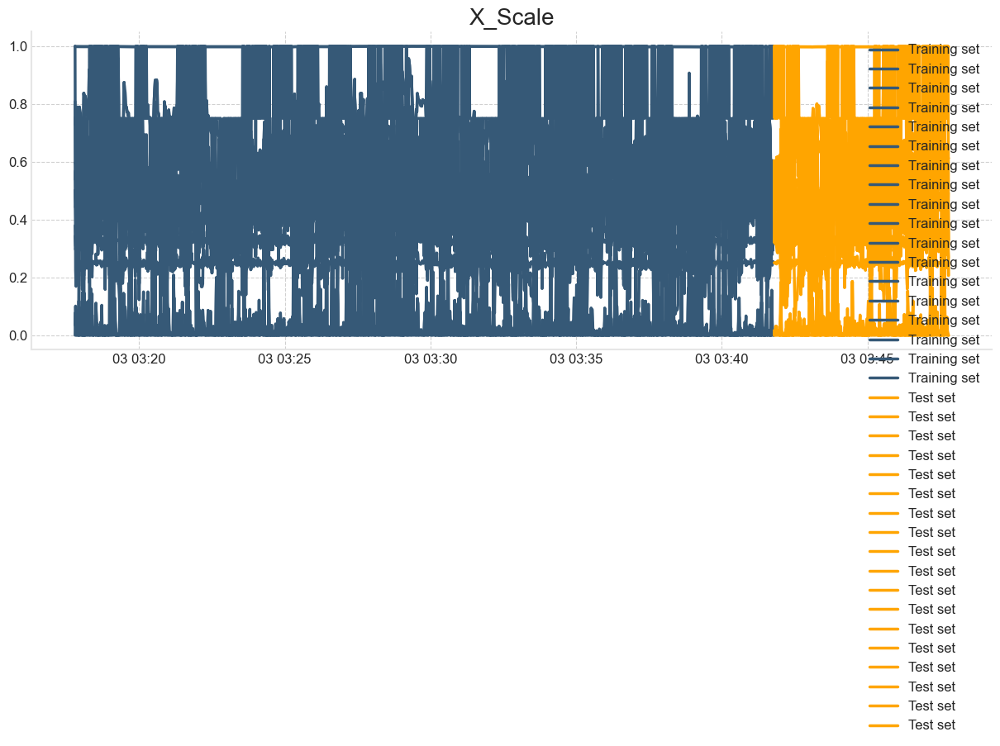

In [46]:
X_train = X_scale[:-test_size]
X_test = X_scale[-test_size:]

plt.title('X_Scale', size=20)
plt.plot(X_train, label='Training set')
plt.plot(X_test, label='Test set', color='orange')
plt.legend();

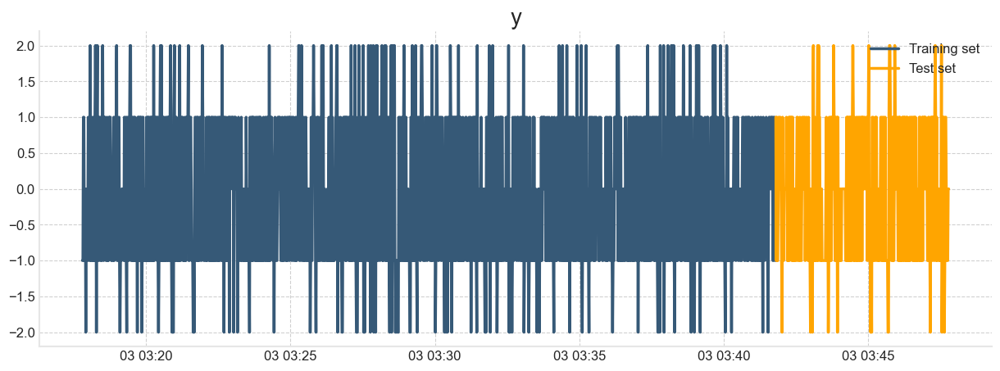

In [47]:
y_train = y[:-test_size]
y_test = y[-test_size:]

plt.title('y', size=20)
plt.plot(y_train, label='Training set')
plt.plot(y_test, label='Test set', color='orange')
plt.legend();

In [180]:
# Logistic Regression
#x_train, x_test, y_train, y_test = train_test_split(X_scale, y, test_size=0.20,
                                                    #random_state=False)
# model fit
logistic_model = LogisticRegression(random_state=False, penalty='elasticnet',
                                    solver='saga', l1_ratio=.56, max_iter=4000, C=1,
                                    class_weight = None)
logistic_model.fit(X_train, y_train)

# logistic_model.predict_proba((X[:2, :])
y_pred = logistic_model.predict(X_test)
accuracy = accuracy_score(y_test, y_pred) * 100
logistic_model.score(X_normalized, y)
confusion_mat = confusion_matrix(y_test, y_pred)

In [181]:
# logistic_model.predict_proba((X[:2, :])
y_pred = logistic_model.predict(X_test)
accuracy = accuracy_score(y_test, y_pred) * 100
logistic_model.score(X_normalized, y)
confusion_mat = confusion_matrix(y_test, y_pred)

print("Accuracy is", accuracy)
print("Confusion Matrix")
print(confusion_mat)


Accuracy is 40.27777777777778
Confusion Matrix
[[  0   9   0   3   0]
 [  0 128   2   8   0]
 [  0  77   5   5   0]
 [  0  95   5  12   0]
 [  0  11   0   0   0]]


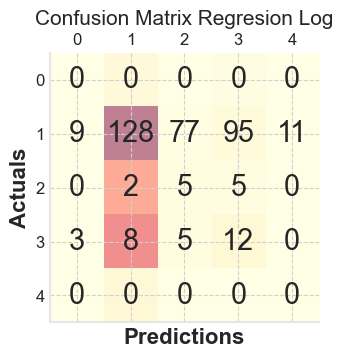

In [173]:
from sklearn.metrics import ConfusionMatrixDisplay
fig, px = plt.subplots(figsize=(3.5, 3.5))
px.matshow(confusion_mat, cmap=plt.cm.YlOrRd, alpha=0.5)
for m in range(confusion_mat.shape[0]):
    for n in range(confusion_mat.shape[1]):
        px.text(x=m,y=n,s=confusion_mat[m, n], va='center', ha='center', size='xx-large')

# Sets the labels
plt.xlabel('Predictions', fontsize=16)
plt.ylabel('Actuals', fontsize=16)
plt.title('Confusion Matrix Regresion Log', fontsize=15)
plt.show()

# 4.3 Naive Bayes

In [51]:
X_train.shape, X_test.shape

((1440, 18), (360, 18))

In [52]:
# instantiate the model
gnb = GaussianNB()
pgmpy


# fit the model
gnb.fit(X_train, y_train)

GaussianNB()

In [53]:
y_pred = gnb.predict(X_test)


In [54]:
accuracy_naive = accuracy_score(y_test, y_pred)*100
print('Model accuracy score: {0:0.4f}'. format(accuracy_score(y_test, y_pred)))

Model accuracy score: 0.2500


In [55]:
y_pred_train = gnb.predict(X_train)

In [56]:
conf_mat = confusion_matrix(y_test, y_pred)

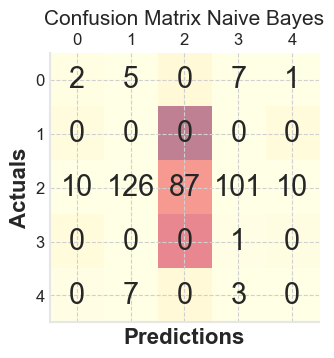

In [57]:
from sklearn.metrics import ConfusionMatrixDisplay
fig, px = plt.subplots(figsize=(3.5, 3.5))
px.matshow(conf_mat, cmap=plt.cm.YlOrRd, alpha=0.5)
for m in range(conf_mat.shape[0]):
    for n in range(conf_mat.shape[1]):
        px.text(x=m,y=n,s=conf_mat[m, n], va='center', ha='center', size='xx-large')

# Sets the labels
plt.xlabel('Predictions', fontsize=16)
plt.ylabel('Actuals', fontsize=16)
plt.title('Confusion Matrix Naive Bayes', fontsize=15)
plt.show()

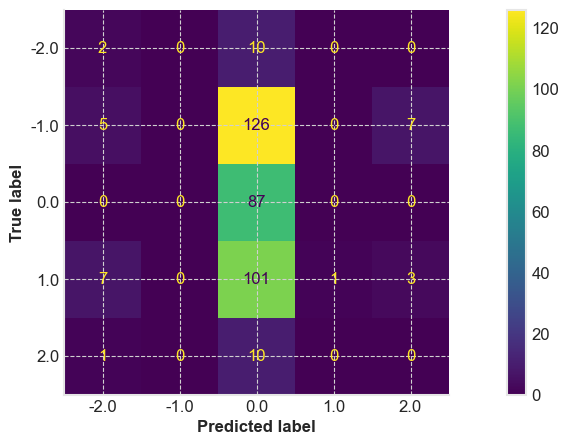

In [58]:
from sklearn.metrics import ConfusionMatrixDisplay


ConfusionMatrixDisplay.from_predictions(
  y_test, y_pred)
plt.show()

# scores


In [63]:
print('martingale' ,accuracy_martingala, '%')
print('Naive Bayes',accuracy_naive,'%')
print('Regresion', accuracy,'%')

martingale 28.999999999999996 %
Naive Bayes 25.0 %
Regresion 40.27777777777778 %
